# Traffic jam exploration
* From the heatmap perspective

In [301]:
%matplotlib inline
import pandas as pd
import gzip
import time
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime 


from skimage import measure


In [2]:
#data locations
data_5min_path = "../station_5min/2015/d11/"
meta_path = "../station_5min/2015/meta_data/d11/"

In [3]:
#get all files to process
onlyfiles = [f for f in listdir(data_5min_path) if isfile(join(data_5min_path, f))]

In [4]:
onlyfiles[0:3]

['d11_text_station_5min_2016_01_01.txt.gz',
 'd11_text_station_5min_2016_01_02.txt.gz',
 'd11_text_station_5min_2016_01_03.txt.gz']

In [5]:
colnames = ['Timestamp','Station','District','Freeway','Direction_of_Travel','LaneType','StationLength','Samples',
            'Perc_Observed','TotalFlow','AvgOccupancy','AvgSpeed',
            'Lane1_Samples','Lane1_Flow','Lane1_AvgOcc','Lane1_AvgSpeed','Lane1_Observed',
            'Lane2_Samples','Lane2_Flow','Lane2_AvgOcc','Lane2_AvgSpeed','Lane2_Observed',
            'Lane3_Samples','Lane3_Flow','Lane3_AvgOcc','Lane3_AvgSpeed','Lane3_Observed',
            'Lane4_Samples','Lane4_Flow','Lane4_AvgOcc','Lane4_AvgSpeed','Lane4_Observed',
            'Lane5_Samples','Lane5_Flow','Lane5_AvgOcc','Lane5_AvgSpeed','Lane5_Observed',
            'Lane6_Samples','Lane6_Flow','Lane6_AvgOcc','Lane6_AvgSpeed','Lane6_Observed',
            'Lane7_Samples','Lane7_Flow','Lane7_AvgOcc','Lane7_AvgSpeed','Lane7_Observed',
            'Lane8_Samples','Lane8_Flow','Lane8_AvgOcc','Lane8_AvgSpeed','Lane8_Observed',]

## Test on a single file first

In [6]:
#Extract contents of file and read to pandas dataframe
with gzip.open(data_5min_path+onlyfiles[0], 'rb') as f:
    file_content = pd.read_csv(f, header=None,names=colnames)

In [7]:
file_content.shape

(410112, 52)

In [8]:
file_content.head(3)

,Timestamp,Station,District,Freeway,Direction_of_Travel,LaneType,StationLength,Samples,Perc_Observed,TotalFlow,...,Lane7_Samples,Lane7_Flow,Lane7_AvgOcc,Lane7_AvgSpeed,Lane7_Observed,Lane8_Samples,Lane8_Flow,Lane8_AvgOcc,Lane8_AvgSpeed,Lane8_Observed
0,01/01/2016 00:00:00,1100313,11,5,N,FR,NaN,10,100,8.0,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0
1,01/01/2016 00:00:00,1100323,11,5,N,FR,NaN,20,0,NaN,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0
2,01/01/2016 00:00:00,1100326,11,5,N,FR,NaN,20,100,12.0,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0


In [72]:
pd.to_datetime('01/01/2016 00:00:00',format='%m/%d/%Y %H:%M:%S')

Timestamp('2016-01-01 00:00:00')

In [156]:
df = file_content[(file_content['Freeway']==5) & (file_content['Direction_of_Travel']=='N')]

df.loc[:,'Timestamp'] = pd.to_datetime(df.loc[:,'Timestamp'],format='%m/%d/%Y %H:%M:%S')


In [196]:
def get_timeslice(df,start_date='01/26/2016', end_date='01/26/2016'):
    
    start = pd.to_datetime(start_date + " 00:00:01", format = '%m/%d/%Y %H:%M:%S')
    end = pd.to_datetime(end_date + " 23:59:00", format = '%m/%d/%Y %H:%M:%S')
    freeway = df[(df['Timestamp'] > start) & (df['Timestamp'] <= end)]
    freeway=freeway.sort_values(['Station','Timestamp'], axis=0, ascending=False)
    
    data = freeway.pivot(index='Station', columns='Timestamp', values='AvgSpeed')
    return data


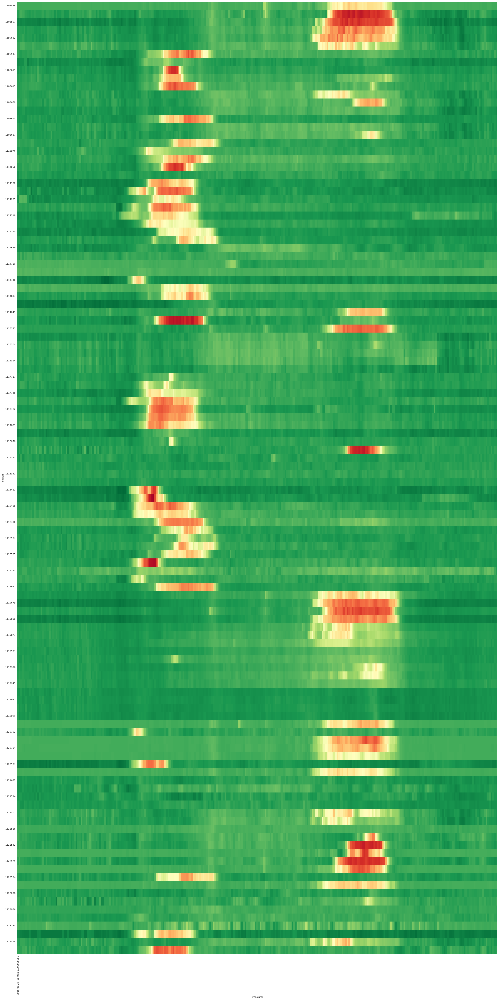

In [205]:
def plot_traffic_heat(data):
    
    f, ax = plt.subplots(figsize=(30, 60))

    sns.heatmap(data, square=False, xticklabels=12*24, yticklabels=2, cbar=False, cmap='RdYlGn')#, center = 65)

    # turn the axis label
    for item in ax.get_yticklabels():
        item.set_rotation(0)

    for item in ax.get_xticklabels():
        item.set_rotation(90)

    # save figure
    #plt.savefig('seabornPandas.png', dpi=100)
    f.tight_layout()

plot_traffic_heat(get_timeslice(df,start_date='01/26/2016', end_date='01/26/2016').dropna(axis=0, how='all'))

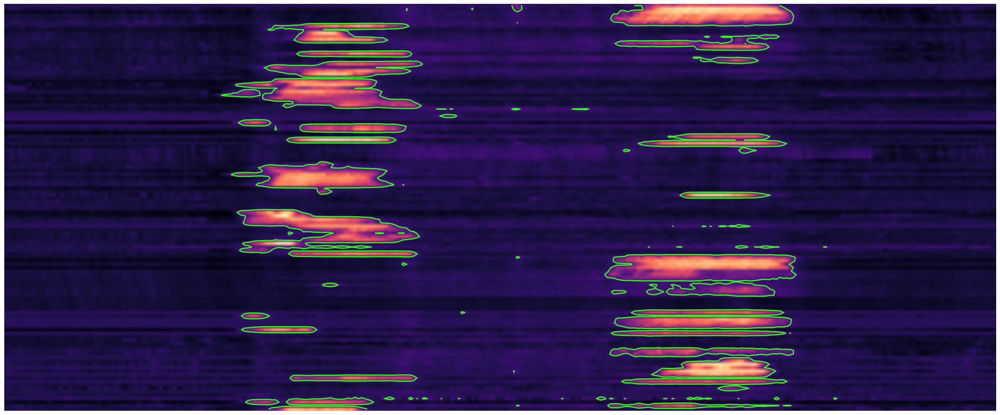

In [321]:





def plot_contours(r, threshold):

    # Find contours at a constant value of 0.8
    contours = measure.find_contours(r, threshold)

    #print(contours)

    # Display the image and plot all contours found
    fig, ax = plt.subplots(figsize=(30, 60))
    ax.imshow(r, cmap='magma_r')

    for n, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color = '#33f725')

    ax.axis('image')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()


    
r = get_timeslice(df,start_date='01/26/2016', end_date='01/26/2016').dropna(axis=0, how='all').values

plot_contours(r, 60)

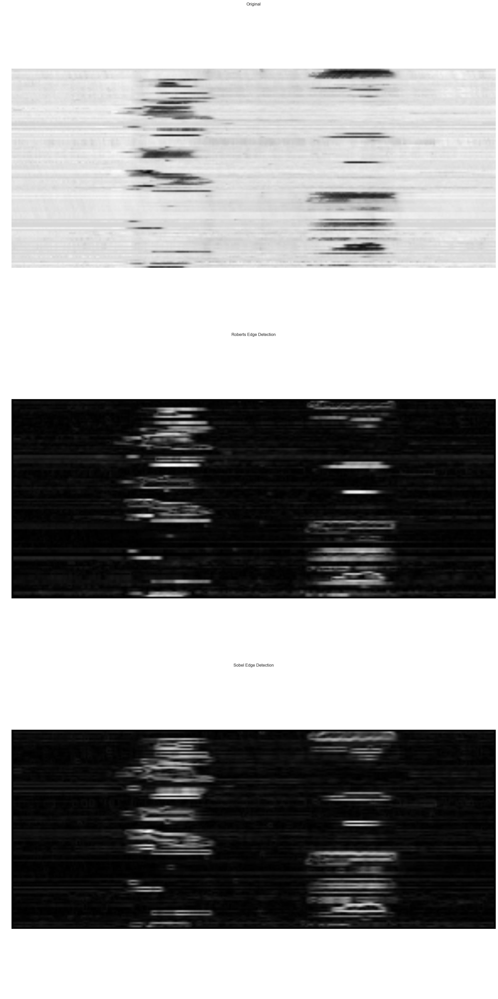

In [256]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.data import camera
from skimage.filters import roberts, sobel, scharr, prewitt


image = get_timeslice(df,start_date='01/26/2016', end_date='01/26/2016').dropna(axis=0, how='all').values

edge_roberts = roberts(image)
edge_sobel = sobel(image)

fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True,
                       figsize=(20, 40))

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original')

ax[1].imshow(edge_roberts, cmap=plt.cm.gray)
ax[1].set_title('Roberts Edge Detection')

ax[2].imshow(edge_sobel, cmap=plt.cm.gray)
ax[2].set_title('Sobel Edge Detection')

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

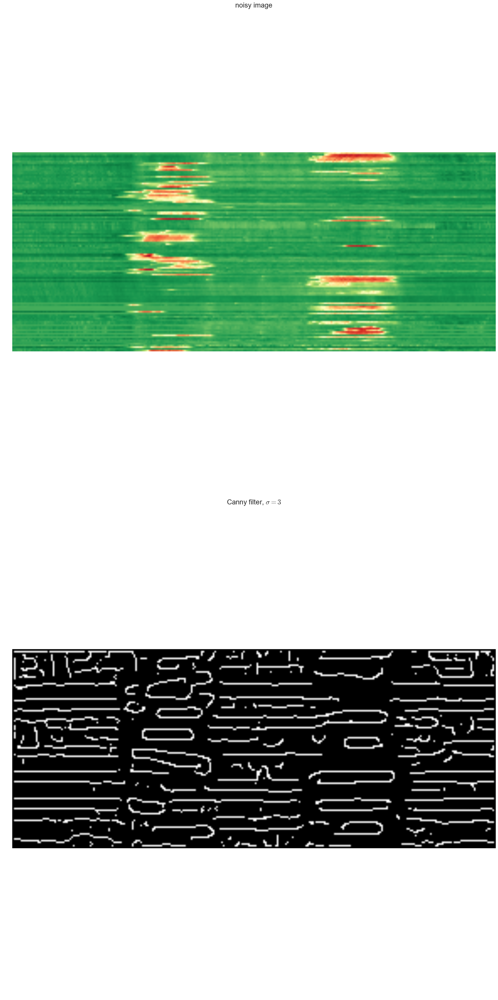

In [245]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import feature


# Generate noisy image of a square
#im = np.zeros((128, 128))
#im[32:-32, 32:-32] = 1

im = get_timeslice(df,start_date='01/26/2016', end_date='01/26/2016').dropna(axis=0, how='all').values


#im = ndi.gaussian_filter(im, 4)
#im += 0.2 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma

edges2 = feature.canny(im, sigma=3)

# display results
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(20, 40),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap='RdYlGn')
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)


ax2.imshow(edges2, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=3$', fontsize=20)

fig.tight_layout()

plt.show()

In [201]:
#find all on ramps

def get_on_ramps(file_content):
    ramps = file_content.loc[file_content['LaneType']=='OR',:]

    interested_columns = ['Timestamp', 'Station', 'District', 'Freeway',
                          'Direction_of_Travel', 'LaneType', 'Samples',
                          'Perc_Observed', 'TotalFlow']
    
    print "good measure:",ramps.loc[:,'TotalFlow'].notnull().sum(), "total:", len(ramps)
    return ramps.loc[ramps.loc[:,'TotalFlow'].notnull(), interested_columns]


def get_off_ramps(file_content):
    ramps = file_content.loc[file_content['LaneType']=='FR',:]

    interested_columns = ['Timestamp', 'Station', 'District', 'Freeway',
                          'Direction_of_Travel', 'LaneType', 'Samples',
                          'Perc_Observed', 'TotalFlow']
    
    print "good measure:",ramps.loc[:,'TotalFlow'].notnull().sum(), "total:",len(ramps)
    return ramps.loc[ramps.loc[:,'TotalFlow'].notnull(), interested_columns]

def get_bad_sensors(file_content, columns):
    file_content['bad_count'] = file_content.loc[:,columns].isnull().sum(axis=1)
    total_bad = file_content.groupby('Station')['bad_count'].sum().reset_index()
    bad_stations = total_bad[total_bad['bad_count'] > 0]['Station'].tolist()
    #file_content['bad_station'] = file_content['Station'].isin(bad_stations) 
    return bad_stations

def get_sensors(file_content):
    return file_content.loc[:,'Station'].unique()

print get_on_ramps(file_content).head(3)
print get_off_ramps(file_content).head(3)

print len(get_bad_sensors(file_content,['TotalFlow']))
print len(get_sensors(file_content))

good measure: 86394 total: 88416
              Timestamp  Station  District  Freeway Direction_of_Travel  \
88  01/26/2016 00:00:00  1108286        11       94                   W   
90  01/26/2016 00:00:00  1108288        11       94                   W   
92  01/26/2016 00:00:00  1108290        11       94                   W   

   LaneType  Samples  Perc_Observed  TotalFlow  
88       OR       10            100        4.0  
90       OR       10            100        2.0  
92       OR       20            100       10.0  
good measure: 56451 total: 65952
             Timestamp  Station  District  Freeway Direction_of_Travel  \
0  01/26/2016 00:00:00  1100313        11        5                   N   
2  01/26/2016 00:00:00  1100326        11        5                   N   
3  01/26/2016 00:00:00  1100330        11        5                   N   

  LaneType  Samples  Perc_Observed  TotalFlow  
0       FR       10            100        7.0  
2       FR       20            100        7.

## Combine all files into one dataframe

In [10]:
df_list = []
for i, filename in enumerate(onlyfiles):
    t1 = time.time()
    with gzip.open(data_5min_path+filename, 'rb') as f:
        file_content = pd.read_csv(f,header=None,names=colnames)
        df_list.append(file_content)
    t2 = time.time()
    print i, filename, t2-t1
    
big_df = pd.concat(df_list)

0 d11_text_station_5min_2016_01_01.txt.gz 2.06097388268
1 d11_text_station_5min_2016_01_02.txt.gz 2.02787399292
2 d11_text_station_5min_2016_01_03.txt.gz 2.16014790535
3 d11_text_station_5min_2016_01_04.txt.gz 2.31096792221
4 d11_text_station_5min_2016_01_05.txt.gz 2.20874404907
5 d11_text_station_5min_2016_01_06.txt.gz 2.20747208595
6 d11_text_station_5min_2016_01_07.txt.gz 2.06038784981
7 d11_text_station_5min_2016_01_08.txt.gz 2.13408589363
8 d11_text_station_5min_2016_01_09.txt.gz 2.17303180695
9 d11_text_station_5min_2016_01_10.txt.gz 2.40312004089
10 d11_text_station_5min_2016_01_11.txt.gz 2.36949586868
11 d11_text_station_5min_2016_01_12.txt.gz 2.30112195015
12 d11_text_station_5min_2016_01_15.txt.gz 2.15998291969
13 d11_text_station_5min_2016_01_16.txt.gz 1.98135495186
14 d11_text_station_5min_2016_01_17.txt.gz 1.98557400703
15 d11_text_station_5min_2016_01_18.txt.gz 1.97651290894
16 d11_text_station_5min_2016_01_19.txt.gz 2.03303098679
17 d11_text_station_5min_2016_01_20.txt.g

In [11]:
big_df.shape

(9842688, 52)

In [177]:
big_df.loc[:,'Timestamp'] = pd.to_datetime(big_df.loc[:,'Timestamp'],format='%m/%d/%Y %H:%M:%S')

In [178]:
big_df.head(3)

,Timestamp,Station,District,Freeway,Direction_of_Travel,LaneType,StationLength,Samples,Perc_Observed,TotalFlow,...,Lane7_Samples,Lane7_Flow,Lane7_AvgOcc,Lane7_AvgSpeed,Lane7_Observed,Lane8_Samples,Lane8_Flow,Lane8_AvgOcc,Lane8_AvgSpeed,Lane8_Observed
0,2016-01-01,1100313,11,5,N,FR,NaN,10,100,8.0,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0
1,2016-01-01,1100323,11,5,N,FR,NaN,20,0,NaN,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0
2,2016-01-01,1100326,11,5,N,FR,NaN,20,100,12.0,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0


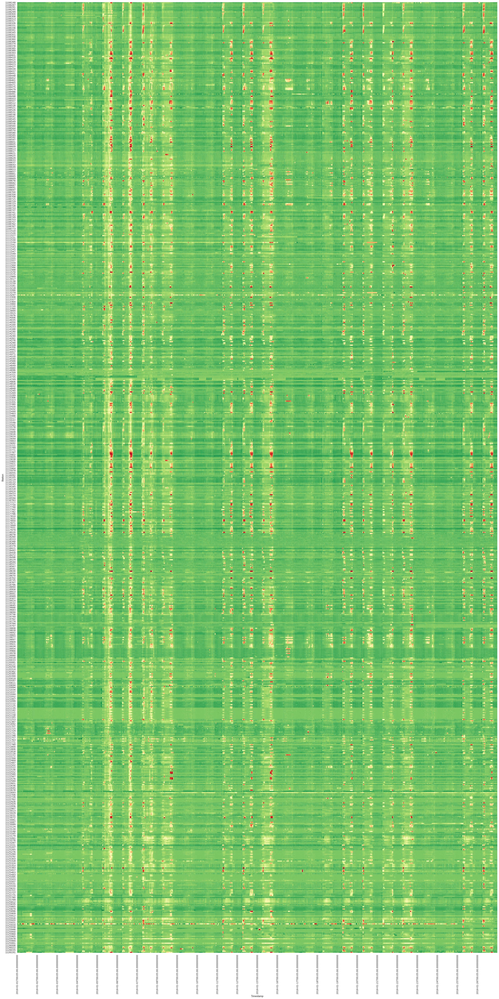

In [206]:
plot_traffic_heat(get_timeslice(big_df,start_date='01/01/2016', end_date='01/26/2016').dropna(axis=0, how='all'))

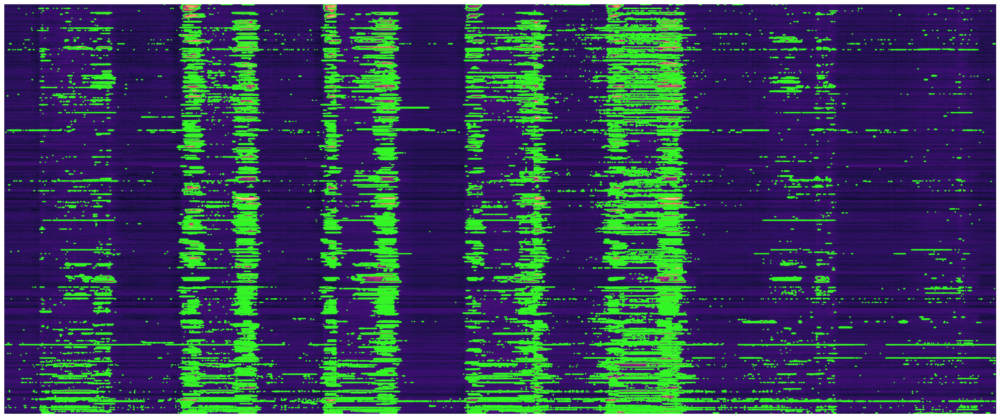

In [323]:
plot_contours(get_timeslice(big_df,start_date='01/18/2016', end_date='01/24/2016').dropna(axis=0, how='all'), 60)